# COGS 108 - The Simpsons and Prediction

https://drive.google.com/file/d/1Hx9kyFD2j_IPr_upJSQdrUlS_2HWHOXg/view?usp=sharing

# Permissions

Place an `X` in the appropriate bracket below to specify if you would like your group's project to be made available to the public. (Note that student names will be included (but PIDs will be scraped from any groups who include their PIDs).

* [X] YES - make available
* [  ] NO - keep private

# Names

- Uma Naik
- Kevin Yu
- Hongyuan Jia
- Nicholas Regli
- Jelani L

# Abstract

In this research project, our goal was to investigate the supposed predictive power of "The Simpsons" in anticipating real-world events. Theorists online believe the show has the ability to predict future occurrences, including Trump's presidency, Disney's Fox purchase, and the coronavirus pandemic. To further explore our topic, we completed an exploratory data analysis (EDA) utilizing a diverse range of datasets, including transcripts of all "Simpsons" episodes, New York Times headlines, and associated metadata. Our approach involved extracting topics from both "The Simpsons'' scripts and New York Times articles, allowing us to compare thematic content and assess potential overlaps. To obtain statistics for how successful the episodes were in predicting real world events, we utilized the dictionary generated after conducting a cosine similarity comparison. Our research contributes to the ongoing discourse surrounding the show's predictive nature and offers insight into the significance of considering several data sources and analytical techniques in media analysis.

# Research Question

General Question: What percentage of the Simpsons’ episodes’ transcripts reference real-world events before they appear as part of a New York Times headline. 
- Subquestion: How closely do the episode's transcripts' air date and New York Times' article publication dates coincide?

## Background and Prior Work


The Simpsons, debuting on Fox in 1989, is one of the longest-running television shows in modern American history with over 34 seasons and counting. With a growing episode count, the American cartoon family has easily made thousands of jokes about scenarios so wild that they could never come true… or could they?

Conspiracies regarding the predictive power of The Simpsons date back to the early 2000s. It is believed rather jokingly that the Simpsons predicted the presidency of Donald Trump, Disney’s purchase of Fox and even more bizarrely the coronavirus pandemic.<a name="cite_ref-1"></a>[<sup>1</sup>](#cite_note-1) CNN reported *The Simpsons* as being the "pop culture Nostradamus" for predicting Lady Gaga's eventual Super Bowl performance and the Siegfried and Roy Tiger Attack.<a name="cite_ref-2"></a>[<sup>2</sup>](#cite_note-2) These coincidences all seem to point toward The Simpsons and its uncanny ability to predict the future. Several other publications have their doubts however, including the *New York Times* themselves who argue that the *prophetic visions* in the show are at best plausible predictions and at worst a product of a massive sample size.<a name="cite_ref-3"></a>[<sup>3</sup>](#cite_note-3) This leads us to our main question: what percentage of The Simpsons’ script came true.

While data projects analyzing the Simpsons have existed prior to our own, such as the excellent "The Simpsons Meets Data Visualization by Adam Reevesman" <a name="cite_ref-4"></a>[<sup>4</sup>](#cite_note-4) and Todd W. Schneider's "The Simpsons by the Data"<a name="cite_ref-5"></a>[<sup>5</sup>](#cite_note-5), much of the data analysis there explores the structure and patterns of the show itself and not of its predictivity of real-world events. Largely, these analyses report on things like the prominence of specific characters on screen, which characters talk to whom the most, and the sentiment analysis of various characters.



1. <a name="cite_note-1"></a> [^](#cite_ref-1) Simpsons Predicts the Future. (2018, February 26). Know Your Meme. https://knowyourmeme.com/memes/simpsons-predicts-the-future 
2. <a name="cite_note-2"></a> [^](#cite_ref-2) France, L. R. (2020, May 8). Another example of “the Simpsons” predicting future. CNN. https://www.cnn.com/2020/05/08/entertainment/simpsons-coronavirus-insects-predictions/index.html 
3. <a name="cite_note-3"></a> [^](#cite_ref-3) Salam, M. (2018, February 2). “the Simpsons” has predicted a lot. most of it can be explained. The New York Times. https://www.nytimes.com/2018/02/02/arts/television/simpsons-prediction-future.html 
3. <a name="cite_ref-4"></a>[^](#cite_note-4) Reevesman, A. (2022, October 13). The Simpsons meets Data Visualization. Medium.https://towardsdatascience.com/the-simpsons-meets-data-visualization-ef8ef0819d13
4. <a name="cite_note-5"></a> [^](#cite_ref-5) Schneider, T. (2016, September 28). The Simpsons by the Data. toddwschneider.com. https://toddwschneider.com/posts/the-simpsons-by-the-data/ 



# Hypothesis


#### Less than 1% of the content in *The Simpsons'* episodes' transcript reference real-world events before they appear in the New York Times' headlines.
- Subhypothesis: Whenever these *The Simpsons'* transcripts' predate an event which is later referenced in the New York Times, the New York Times article will reference it at least 10 years afterwards.

Reasoning: We believe that *The Simpsons'* fabled ability to predict the future is reliant on coincidences. As the series has continued, their jokes have been so numerous that a select minority of them are bound to have become real.

# Data

## Dataset #1: The Simpsons Dataset

Since there is no dataset with all *The Simpsons* information including episode air date and transcript information, we need to make our own.

We need to include information like 'episode number', 'season number', 'overall episode number', 'director', 'writer', 'episode air date', 'production code', and 'script'

- 'episode number', 'season number' and 'overall episode number' are the int datatype.
- 'director', 'writer', 'production code' and 'script' are the string datatype.
- 'episode air date' is the datetime datatype.

In [1]:
# import pytesseract & pillow for text extraction
!pip install pytesseract;
!pip install pillow;
!pip install lxml;
!pip install wikipedia;
#import urlopen
from urllib.request import urlopen;

# import pandas & numpy library
import pandas as pd;
import numpy as np;

# Import seaborn and apply its plotting styles
import seaborn as sns;
sns.set(font_scale=2, style="white");

# import matplotlib
import matplotlib as mpl;
import matplotlib.pyplot as plt;
import matplotlib.style as style;
# set plotting size parameter
plt.rcParams['figure.figsize'] = (12, 5);

# packages helpful for webscraping
import requests;
import bs4;
from bs4 import BeautifulSoup;
import wikipedia as wp;
import re;
import time;
import string;

#improve resolution
%config InlineBackend.figure_format ='retina';

Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable


All transcripts come from https://transcripts.foreverdreaming.org/viewforum.php?f=431

Original Air Dates for All Simpsons Episodes come from:
- https://en.wikipedia.org/wiki/List_of_The_Simpsons_episodes_(seasons_1%E2%80%9320)
- https://en.wikipedia.org/wiki/List_of_The_Simpsons_episodes_(season_21%E2%80%93present)

For this section, we are focused on gathering information regarding each Simpsons episode minus the movie. The easiest way to do this is by using the `wikipedia` package to read the tables in as one large pandas DataFrame.

Information regarding individual Simpsons episodes are split between two wikipedia pages: seasons 1-20 and seasons 21-Present. We will concatenate them into one common `wiki` dataframe.

The wikipedia tables are already split by season, so we will add in the `season` number into its own column.

In [2]:
#grabbing wikipedia tables of every episode
wiki_table = pd.read_html('https://en.wikipedia.org/wiki/List_of_The_Simpsons_episodes_(seasons_1%E2%80%9320)')
wiki_table2 = pd.read_html('https://en.wikipedia.org/wiki/List_of_The_Simpsons_episodes_(season_21%E2%80%93present)')

#removing the movie
del wiki_table[19]

#combining tables
list_tables = wiki_table[1:21]

#adding season numbers to episodes
for i in range(20):
    list_tables[i].insert(1,"season",i+1)

list_tables2 = wiki_table2[2:16]
#adding season numbers to episodes
for i in range(14):
    list_tables2[i].insert(1,"season",i+21)

wiki_table_merged = pd.concat(list_tables)
wiki_table_merged2 = pd.concat(list_tables2)
list_wiki = [wiki_table_merged, wiki_table_merged2]
wiki = pd.concat(list_wiki,ignore_index=True)

wiki.head(5)

,No. overall,season,No. in season,Title,Directed by,Written by,Original air date,Prod. code,U.S. viewers (millions)
0,1.0,1,1.0,"""Simpsons Roasting on an Open Fire""",David Silverman,Mimi Pond,"December 17, 1989",7G08,26.7[46]
1,2.0,1,2.0,"""Bart the Genius""",David Silverman,Jon Vitti,"January 14, 1990",7G02,24.5[46]
2,3.0,1,3.0,"""Homer's Odyssey""",Wes Archer,Jay Kogen & Wallace Wolodarsky,"January 21, 1990",7G03,27.5[47]
3,4.0,1,4.0,"""There's No Disgrace Like Home""",Gregg Vanzo & Kent Butterworth,Al Jean & Mike Reiss,"January 28, 1990",7G04,20.2[48]
4,5.0,1,5.0,"""Bart the General""",David Silverman,John Swartzwelder,"February 4, 1990",7G05,27.1[49]


Our `wiki` dataframe has some pretty long names. Let's shorten them a bit so it will be easier to navigate.

In [3]:
wiki.columns = map(str.lower, wiki.columns)
wiki = wiki.rename(columns={'directed by':'director', 
                            'written by':'writer', 
                            'original air date':'air date',
                            'u.s. viewers (millions)': 'viewers'})

wiki.head(5)

,no. overall,season,no. in season,title,director,writer,air date,prod. code,viewers
0,1.0,1,1.0,"""Simpsons Roasting on an Open Fire""",David Silverman,Mimi Pond,"December 17, 1989",7G08,26.7[46]
1,2.0,1,2.0,"""Bart the Genius""",David Silverman,Jon Vitti,"January 14, 1990",7G02,24.5[46]
2,3.0,1,3.0,"""Homer's Odyssey""",Wes Archer,Jay Kogen & Wallace Wolodarsky,"January 21, 1990",7G03,27.5[47]
3,4.0,1,4.0,"""There's No Disgrace Like Home""",Gregg Vanzo & Kent Butterworth,Al Jean & Mike Reiss,"January 28, 1990",7G04,20.2[48]
4,5.0,1,5.0,"""Bart the General""",David Silverman,John Swartzwelder,"February 4, 1990",7G05,27.1[49]


Currently, our `wiki` dataframe is filled with only object datatypes. Let's assign each column to a datatype that we can work with.

In [4]:
wiki = wiki.astype({'air date':'string'})
wiki = wiki.astype({'director':'string'})
wiki = wiki.astype({'writer':'string'})
wiki = wiki.astype({'title':'string'})
wiki = wiki.astype({'prod. code':'string'})
wiki = wiki.astype({'viewers':'string'})
wiki = wiki.astype({'season':'float'})

wiki['title'] = wiki['title'].str.lower()
wiki['title'] = wiki['title'].str.replace('"','')
wiki['title'] = wiki['title'].str.translate(str.maketrans('','',string.punctuation))
wiki['director'] = wiki['director'].str.lower()
wiki['writer'] = wiki['writer'].str.lower()

#turning air date to datetime
wiki['air date'] = wiki['air date'].str.replace(',', '')
wiki[['air date','extra']] = wiki['air date'].str.split('[',expand = True)
wiki['air date'] = pd.to_datetime(wiki['air date'], format= "%B %d %Y")

wiki.pop('extra')
wiki = wiki.dropna()

#turning viewer count to float
wiki['viewers'] = wiki['viewers'].str.split('[')
wiki['viewers'] = wiki['viewers'].str[0]
wiki = wiki.astype({'viewers':'float'})

wiki

,no. overall,season,no. in season,title,director,writer,air date,prod. code,viewers
0,1.0,1.0,1.0,simpsons roasting on an open fire,david silverman,mimi pond,1989-12-17,7G08,26.70
1,2.0,1.0,2.0,bart the genius,david silverman,jon vitti,1990-01-14,7G02,24.50
2,3.0,1.0,3.0,homers odyssey,wes archer,jay kogen & wallace wolodarsky,1990-01-21,7G03,27.50
3,4.0,1.0,4.0,theres no disgrace like home,gregg vanzo & kent butterworth,al jean & mike reiss,1990-01-28,7G04,20.20
4,5.0,1.0,5.0,bart the general,david silverman,john swartzwelder,1990-02-04,7G05,27.10
...,...,...,...,...,...,...,...,...,...
800,746.0,34.0,18.0,fanily feud,timothy bailey,broti gupta,2023-04-23,OABF11,1.00
801,747.0,34.0,19.0,write off this episode,matthew nastuk,j. stewart burns,2023-04-30,OABF12,0.89
802,748.0,34.0,20.0,the very hungry caterpillars,gabriel defrancesco,brian kelley,2023-05-07,OABF14,0.82
803,749.0,34.0,21.0,clown v board of education,lance kramer,jeff westbrook,2023-05-14,OABF15,0.77


We are going to base our final dataframe `df_simpsons` off of the the `wiki` dataframe we just made. The only difference between these two dataframes is that we now have a new column: `script`

In [5]:
df_simpsons = wiki
df_simpsons['script'] = np.nan

df_simpsons.head(5)

,no. overall,season,no. in season,title,director,writer,air date,prod. code,viewers,script
0,1.0,1.0,1.0,simpsons roasting on an open fire,david silverman,mimi pond,1989-12-17,7G08,26.7,NaN
1,2.0,1.0,2.0,bart the genius,david silverman,jon vitti,1990-01-14,7G02,24.5,NaN
2,3.0,1.0,3.0,homers odyssey,wes archer,jay kogen & wallace wolodarsky,1990-01-21,7G03,27.5,NaN
3,4.0,1.0,4.0,theres no disgrace like home,gregg vanzo & kent butterworth,al jean & mike reiss,1990-01-28,7G04,20.2,NaN
4,5.0,1.0,5.0,bart the general,david silverman,john swartzwelder,1990-02-04,7G05,27.1,NaN


Here, we are creating a list of urls called `url_list` filled with a link to each transcript. To do this however, we need a set of web pages that contain these urls, called `page_list`.

We are going to use BeautifulSoup to: 
- grab each availible url from `page_list`
- check if each url leads to a transcript page
- add each transcript page to `url_list`

In [6]:
url_list = []

#all pages with simpsons transcripts
page_list = ['https://transcripts.foreverdreaming.org/viewforum.php?f=431',
            'https://transcripts.foreverdreaming.org/viewforum.php?f=431&start=78',
            'https://transcripts.foreverdreaming.org/viewforum.php?f=431&start=156',
            'https://transcripts.foreverdreaming.org/viewforum.php?f=431&start=234',
            'https://transcripts.foreverdreaming.org/viewforum.php?f=431&start=312',
            'https://transcripts.foreverdreaming.org/viewforum.php?f=431&start=390',
            'https://transcripts.foreverdreaming.org/viewforum.php?f=431&start=468',
            'https://transcripts.foreverdreaming.org/viewforum.php?f=431&start=546',
            'https://transcripts.foreverdreaming.org/viewforum.php?f=431&start=624',
            'https://transcripts.foreverdreaming.org/viewforum.php?f=431&start=702']

#creating function to find all transcripturls on single page
def findurls(url):
    reqs = requests.get(url)
    soup = BeautifulSoup(reqs.text, 'html.parser')
    urlstart = 'https://transcripts.foreverdreaming.org/'
    for link in soup.find_all("a",{"class":"topictitle"}):
        urlend = str(link.get('href'))
        urlend = (urlend[1:])
        completeurl = urlstart + urlend
        if completeurl == 'https://transcripts.foreverdreaming.org/viewtopic.php?t=32146':
            #getting rid of urls that are regular blog posts and not transcripts
            return
        url_list.append(completeurl)

for link in page_list:
    findurls(link)

We now have a list of urls for every availible transcript for each Simpsons episode from this website. We now need to scrape the html of each individual url for their episode number, season number, and (of course) their transcript.

To do this, we need to create a few functions which can remove html tags to read text from webpages clearly called `remove_html_tags`. With this, we will create another function called `insertdata`, which will add the transcripts we just got to our `df_simpsons` dataset based on their matching season and episode numbers.

In [7]:
#remove HTML tags from transcript
def remove_html_tags(text):
    clean = re.compile('<.*?>')
    return re.sub(clean, '', text)

#creating function to insert rows of simpsons transcripts
def insertdata(url):
    #creating beutiful soup object
    page = requests.get(url)
    soup = BeautifulSoup(page.content, "html.parser")
    results = soup.find("div",{"class":'content'})
    script = remove_html_tags(str(results)).strip()
    script = script.replace('\n', ' ')

    #returns title, season and episode
    title_and_numb = soup.find("h2", class_="topic-title")

    title_ep = title_and_numb.text.strip()
    title_ep = str(title_ep)
    title_ep = title_ep.split('-',1)

    ep_szn = title_ep[0].strip()
    
    #fan transcript site did not properly label episode '28x09'
    if ep_szn == '08x09':
        ep_szn = '28x09'
    
    if '&' in ep_szn:
        ep_szn = ep_szn.split('&')
    
    if type(ep_szn) is list:
        ep_szn = ep_szn[0].split('x')
    else:
        ep_szn = ep_szn.split('x')
    
    szn = ep_szn[0].strip()
    
    try:
        szn = float(szn)
    except:
        return None
        
    ep = float(ep_szn[1].strip())
    
    #since we are observing predictive power, we do not need the most recent season (35)
    if szn > 34:
        return None
    
    #row = {'season': szn, 'episode':ep ,'script':script}
    df_simpsons.loc[(df_simpsons['season'] == szn) & (df_simpsons['no. in season'] == ep), 'script'] = script
    return

Once we have our `insertdata` fucntion, we need to grab every url in our `url_list` and plug it in using a for-loop. Since scraping over 700 urls takes time, we added a status indicator for how far along the program is in filling out the `df_simpsons` dataframe.

In [8]:
from IPython.display import clear_output

#for status indication because gathering data takes a while
i = 1
url_count = len(url_list)

for url in url_list:
    clear_output(wait=True)
    finished = 100*(i/url_count)
    print(str(finished) +'% finished')
    insertdata(url)
    i=i+1

100.0% finished


We are now finished with our initial Simpsons dataframe! From now on, data analysis will be using our dataset `simpsons.csv`

In [9]:
df_simpsons = df_simpsons.drop_duplicates(subset='script', keep="first")
df_simpsons = df_simpsons.reset_index(drop=True)
df_simpsons['script'] = df_simpsons['script'].str.lower()
df_simpsons['script'] = df_simpsons['script'].astype(str)
df_simpsons.to_csv('simpsons.csv')
df_simpsons

,no. overall,season,no. in season,title,director,writer,air date,prod. code,viewers,script
0,1.0,1.0,1.0,simpsons roasting on an open fire,david silverman,mimi pond,1989-12-17,7G08,26.70,"marge: ooh! careful, homer! homer: there's no..."
1,2.0,1.0,2.0,bart the genius,david silverman,jon vitti,1990-01-14,7G02,24.50,"bart: come on, mom. lisa: yeah, mom. hurry up..."
2,3.0,1.0,3.0,homers odyssey,wes archer,jay kogen & wallace wolodarsky,1990-01-21,7G03,27.50,"(chattering) mrs. krabappel: now class, i don..."
3,4.0,1.0,4.0,theres no disgrace like home,gregg vanzo & kent butterworth,al jean & mike reiss,1990-01-28,7G04,20.20,"bart: yeah. lisa: yeah. bart: oh, yeah? lis..."
4,5.0,1.0,5.0,bart the general,david silverman,john swartzwelder,1990-02-04,7G05,27.10,"inside, homer opens an oven. homer: do i smel..."
...,...,...,...,...,...,...,...,...,...,...
744,746.0,34.0,18.0,fanily feud,timothy bailey,broti gupta,2023-04-23,OABF11,1.00,here's your ticket to witness history. chuc...
745,747.0,34.0,19.0,write off this episode,matthew nastuk,j. stewart burns,2023-04-30,OABF12,0.89,"hey, bettors, gambling's now legal in every st..."
746,748.0,34.0,20.0,the very hungry caterpillars,gabriel defrancesco,brian kelley,2023-05-07,OABF14,0.82,♪ ♪ (singsongy): here comes the breakfast b...
747,749.0,34.0,21.0,clown v board of education,lance kramer,jeff westbrook,2023-05-14,OABF15,0.77,"(humming happily) oh krusty-o, oh krusty-o,..."


## Dataset #2: NYT Headlines

The datasets we are gathering from the *New York Times* come from: https://www.kaggle.com/datasets/johnbandy/new-york-times-headlines/ by Jack Brandy.

`df_NYT` will be split into the following columns with these datatypes:

- `'index'`         - int
- `'headline'`      - string
- `'source'`        - string
- `'word_count'`    - string
- `'url'`           - string
- `'print_section'` - string
- `'print_page'`    - object
- `'author'`        - string
- `'type'`          - string
- `'pub_date'`      - datetime
- `'news_desk'`     - string
- `'section'`       - string
- `'year'`          - float

Here, we are going to load all of our `new_york_times_stories_year.csv` files locally to create our data set.

In [10]:
# Imports - these are all the imports needed for the assignment
%matplotlib inline

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import gzip

# Import nltk package 
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.tokenize import RegexpTokenizer
from nltk.stem import PorterStemmer

from datetime import datetime

import warnings
warnings.filterwarnings('ignore')

# scikit-learn imports
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.metrics import classification_report, precision_recall_fscore_support

In [11]:
nyt_df1990 = pd.read_csv('NYT Data/new_york_times_stories_1990.csv')
nyt_df1991 = pd.read_csv('NYT Data/new_york_times_stories_1991.csv')
nyt_df1992 = pd.read_csv('NYT Data/new_york_times_stories_1992.csv')
nyt_df1993 = pd.read_csv('NYT Data/new_york_times_stories_1993.csv')
nyt_df1994 = pd.read_csv('NYT Data/new_york_times_stories_1994.csv')
nyt_df1995 = pd.read_csv('NYT Data/new_york_times_stories_1995.csv')
nyt_df1996 = pd.read_csv('NYT Data/new_york_times_stories_1996.csv')
nyt_df1997 = pd.read_csv('NYT Data/new_york_times_stories_1997.csv')
nyt_df1998 = pd.read_csv('NYT Data/new_york_times_stories_1998.csv')
nyt_df1999 = pd.read_csv('NYT Data/new_york_times_stories_1999.csv')
nyt_df2000 = pd.read_csv('NYT Data/new_york_times_stories_2000.csv')
nyt_df2001 = pd.read_csv('NYT Data/new_york_times_stories_2001.csv')
nyt_df2002 = pd.read_csv('NYT Data/new_york_times_stories_2002.csv')
nyt_df2003 = pd.read_csv('NYT Data/new_york_times_stories_2003.csv')
nyt_df2004 = pd.read_csv('NYT Data/new_york_times_stories_2004.csv')
nyt_df2005 = pd.read_csv('NYT Data/new_york_times_stories_2005.csv')
nyt_df2006 = pd.read_csv('NYT Data/new_york_times_stories_2006.csv')
nyt_df2007 = pd.read_csv('NYT Data/new_york_times_stories_2007.csv')
nyt_df2008 = pd.read_csv('NYT Data/new_york_times_stories_2008.csv')
nyt_df2009 = pd.read_csv('NYT Data/new_york_times_stories_2009.csv')
nyt_df2010 = pd.read_csv('NYT Data/new_york_times_stories_2010.csv')
nyt_df2011 = pd.read_csv('NYT Data/new_york_times_stories_2011.csv')
nyt_df2012 = pd.read_csv('NYT Data/new_york_times_stories_2012.csv')
nyt_df2013 = pd.read_csv('NYT Data/new_york_times_stories_2013.csv')
nyt_df2014 = pd.read_csv('NYT Data/new_york_times_stories_2014.csv')
nyt_df2015 = pd.read_csv('NYT Data/new_york_times_stories_2015.csv')
nyt_df2016 = pd.read_csv('NYT Data/new_york_times_stories_2016.csv')
nyt_df2017 = pd.read_csv('NYT Data/new_york_times_stories_2017.csv')
nyt_df2018 = pd.read_csv('NYT Data/new_york_times_stories_2018.csv')
nyt_df2019 = pd.read_csv('NYT Data/new_york_times_stories_2019.csv')
nyt_df2020 = pd.read_csv('NYT Data/new_york_times_stories_2020.csv')

nytlist = [nyt_df1990,nyt_df1991,nyt_df1992, nyt_df1993,nyt_df1994,nyt_df1995,nyt_df1996,nyt_df1997,nyt_df1998,
           nyt_df1999,nyt_df2000,nyt_df2001,nyt_df2002,nyt_df2003,nyt_df2004,nyt_df2005,nyt_df2006,nyt_df2007,
           nyt_df2008,nyt_df2009,nyt_df2010,nyt_df2011,nyt_df2012,nyt_df2013,nyt_df2014,nyt_df2015,nyt_df2016,
           nyt_df2017,nyt_df2018,nyt_df2019,nyt_df2020]

In [12]:
df_NYT = pd.concat(nytlist, axis=0).reset_index()

df_NYT = df_NYT.dropna(how='all')
df_NYT = df_NYT.dropna(subset = 'pub_date')
df_NYT = df_NYT.drop(df_NYT[df_NYT['pub_date'] == '2006'].index)
df_NYT

,index,headline,source,word_count,url,print_section,print_page,author,type,pub_date,news_desk,section,year
0,0,Bridge,The New York Times,411.0,https://www.nytimes.com/1990/01/01/nyregion/br...,1,45.0,By Alan Truscott,article,1990-01-01T05:00:00+0000,Metropolitan Desk,New York,1990.0
1,1,He Has Tyson On His Mind,The New York Times,199.0,https://www.nytimes.com/1990/01/01/sports/spor...,1,38.0,By Phil Berger,article,1990-01-01T05:00:00+0000,Sports Desk,Sports,1990.0
2,2,"For Dinkins, Pomp, Ceremony, Triumph And a Dre...",The New York Times,1233.0,https://www.nytimes.com/1990/01/01/nyregion/fo...,1,27.0,By Don Terry,article,1990-01-01T05:00:00+0000,Metropolitan Desk,New York,1990.0
3,3,Army Doesn't Have to Compete With Marines; W...,The New York Times,524.0,https://www.nytimes.com/1990/01/01/opinion/l-a...,1,24.0,NaN,article,1990-01-01T05:00:00+0000,Editorial Desk,Opinion,1990.0
4,4,Students Must Get to School and Back Safely,The New York Times,363.0,https://www.nytimes.com/1990/01/01/opinion/l-s...,1,24.0,NaN,article,1990-01-01T05:00:00+0000,Editorial Desk,Opinion,1990.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3173032,55488,"‘Ratatouille,’ the Musical: How This TikTok Cr...",The New York Times,1219.0,https://www.nytimes.com/2020/12/31/theater/rat...,NaN,NaN,By Christina Morales,article,2020-12-31T17:37:48+0000,Weekend,Theater,2020.0
3173033,55489,Some recipe ideas for a New Year’s Eve at home.,The New York Times,255.0,https://www.nytimes.com/2020/12/31/world/new-y...,NaN,NaN,NaN,article,2020-12-31T17:50:27+0000,National,World,2020.0
3173034,55490,Microsoft Says Russian Hackers Viewed Some of ...,The New York Times,340.0,https://www.nytimes.com/2020/12/31/technology/...,NaN,NaN,By Nicole Perlroth,article,2020-12-31T18:02:02+0000,Business,Technology,2020.0
3173035,55491,New in Paperback: ‘The Red Lotus’ and ‘This Is...,The New York Times,385.0,https://www.nytimes.com/2020/12/31/books/revie...,BR,20,By Jennifer Krauss,article,2020-12-31T18:03:01+0000,BookReview,Books,2020.0


In [13]:
df_NYT = df_NYT.astype({'headline':'string'})
df_NYT = df_NYT.astype({'source':'string'})
df_NYT = df_NYT.astype({'url':'string'})
df_NYT = df_NYT.astype({'print_section':'string'})
df_NYT = df_NYT.astype({'author':'string'})
df_NYT = df_NYT.astype({'type':'string'})
df_NYT = df_NYT.astype({'news_desk':'string'})
df_NYT = df_NYT.astype({'section':'string'})

Currently, `df_NYT` dataset needs a little cleaning. Most importantly, the `pub_date` column needs to be converted to the `datetime` datatype. For this, we needed to create a function `formatnytdate` to properly translate a string into a usable datetime format. 

Additionally, we should also make all of our headlines lowercase.

In [14]:
def formatnytdate(date):
    if date is datetime:
        return
    else:
        date = str(date)
        dateshorten = date[:10]
        dateformat = '%Y-%m-%d'
        return datetime.strptime(dateshorten, dateformat)

In [15]:
df_NYT['pub_date'] = df_NYT['pub_date'].apply(formatnytdate)
df_NYT['headline'] = df_NYT['headline'].str.lower()
df_NYT['headline'] = df_NYT['headline'].astype(str)

And we're done! We now have our datasets `df_simpsons` and `df_NYT` ready for analysis.

# Results

## Exploratory Data Analysis

### EDA 1: Vizualizing Word Stem Usage Across the Simpsons and NYT

One of the first things we wanted to see is if there were any trends where if a word was used in *The Simpsons*, how long it would take for that same word to be used in a *New York Times* Headline. For this, we used simple natural language processing (NLP).

In [16]:
ps = PorterStemmer()
stop_words = set(stopwords.words('english'))

In [17]:
df_simpsons['tokens'] = df_simpsons['script'].apply(lambda x: word_tokenize(x))
df_NYT['tokens'] = df_NYT['headline'].apply(lambda x: word_tokenize(x))

In [18]:
df_simpsons['script_stop'] = df_simpsons['tokens'].apply(lambda x: [item for item in x if item not in stop_words])
df_NYT['headline_stop'] = df_NYT['tokens'].apply(lambda x: [item for item in x if item not in stop_words])

In [19]:
df_simpsons['script_stem'] = df_simpsons['script_stop'].apply(lambda x: [ps.stem(y) for y in x])
df_NYT['headline_stem'] = df_NYT['headline_stop'].apply(lambda x: [ps.stem(y) for y in x])

In [20]:
df_simpsons

,no. overall,season,no. in season,title,director,writer,air date,prod. code,viewers,script,tokens,script_stop,script_stem
0,1.0,1.0,1.0,simpsons roasting on an open fire,david silverman,mimi pond,1989-12-17,7G08,26.70,"marge: ooh! careful, homer! homer: there's no...","[marge, :, ooh, !, careful, ,, homer, !, homer...","[marge, :, ooh, !, careful, ,, homer, !, homer...","[marg, :, ooh, !, care, ,, homer, !, homer, :,..."
1,2.0,1.0,2.0,bart the genius,david silverman,jon vitti,1990-01-14,7G02,24.50,"bart: come on, mom. lisa: yeah, mom. hurry up...","[bart, :, come, on, ,, mom, ., lisa, :, yeah, ...","[bart, :, come, ,, mom, ., lisa, :, yeah, ,, m...","[bart, :, come, ,, mom, ., lisa, :, yeah, ,, m..."
2,3.0,1.0,3.0,homers odyssey,wes archer,jay kogen & wallace wolodarsky,1990-01-21,7G03,27.50,"(chattering) mrs. krabappel: now class, i don...","[(, chattering, ), mrs., krabappel, :, now, cl...","[(, chattering, ), mrs., krabappel, :, class, ...","[(, chatter, ), mrs., krabappel, :, class, ,, ..."
3,4.0,1.0,4.0,theres no disgrace like home,gregg vanzo & kent butterworth,al jean & mike reiss,1990-01-28,7G04,20.20,"bart: yeah. lisa: yeah. bart: oh, yeah? lis...","[bart, :, yeah, ., lisa, :, yeah, ., bart, :, ...","[bart, :, yeah, ., lisa, :, yeah, ., bart, :, ...","[bart, :, yeah, ., lisa, :, yeah, ., bart, :, ..."
4,5.0,1.0,5.0,bart the general,david silverman,john swartzwelder,1990-02-04,7G05,27.10,"inside, homer opens an oven. homer: do i smel...","[inside, ,, homer, opens, an, oven, ., homer, ...","[inside, ,, homer, opens, oven, ., homer, :, s...","[insid, ,, homer, open, oven, ., homer, :, sme..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
744,746.0,34.0,18.0,fanily feud,timothy bailey,broti gupta,2023-04-23,OABF11,1.00,here's your ticket to witness history. chuc...,"[here, 's, your, ticket, to, witness, history,...","['s, ticket, witness, history, ., chuck, wildl...","['s, ticket, wit, histori, ., chuck, wildler, ..."
745,747.0,34.0,19.0,write off this episode,matthew nastuk,j. stewart burns,2023-04-30,OABF12,0.89,"hey, bettors, gambling's now legal in every st...","[hey, ,, bettors, ,, gambling, 's, now, legal,...","[hey, ,, bettors, ,, gambling, 's, legal, ever...","[hey, ,, bettor, ,, gambl, 's, legal, everi, s..."
746,748.0,34.0,20.0,the very hungry caterpillars,gabriel defrancesco,brian kelley,2023-05-07,OABF14,0.82,♪ ♪ (singsongy): here comes the breakfast b...,"[♪, ♪, (, singsongy, ), :, here, comes, the, b...","[♪, ♪, (, singsongy, ), :, comes, breakfast, b...","[♪, ♪, (, singsongi, ), :, come, breakfast, bu..."
747,749.0,34.0,21.0,clown v board of education,lance kramer,jeff westbrook,2023-05-14,OABF15,0.77,"(humming happily) oh krusty-o, oh krusty-o,...","[(, humming, happily, ), oh, krusty-o, ,, oh, ...","[(, humming, happily, ), oh, krusty-o, ,, oh, ...","[(, hum, happili, ), oh, krusty-o, ,, oh, krus..."




Now that we have the stems for both the Simpsons transcripts and the NYT headlines, we can compare when the first time a word shows up in the Simpsons versus when they show up in the NYT.


In [21]:
def check_stem(x, dicts, date):
    if x not in dicts:
        dicts.update({x:date})
    else:
        return

Here, we are making a dictionary for the first time a word is used in the Simpsons television show and assigning it to a dictionary called `simp_dict` along with its date of use. Similarly, first time a word stem is used in a New York Times Headline it will appear in `nyt_dict`.

In [22]:
simp_stems = df_simpsons['script_stem']

simp_dict = {}
for x in range(len(simp_stems)):
    listy = df_simpsons['script_stem'].iloc[x]
    date = df_simpsons['air date'].iloc[x]
    
    for y in listy:
        check_stem(y,simp_dict, date)

total_unique_simp = len(simp_dict)
print(total_unique_simp)

40415


In [23]:
nyt_stems = df_NYT['headline_stem']

nyt_dict = {}
for x in range(len(nyt_stems)):
    listy = df_NYT['headline_stem'].iloc[x]
    date = df_NYT['pub_date'].iloc[x]
    
    for y in listy:
        if y is list:
            y = tuple(y)
        check_stem(y, nyt_dict,date)

total_unique_nyt = len(nyt_dict)
print(total_unique_nyt)

228903


Now, we will take *only* the words which have appeared in *both* `simp_dict` and `nyt_dict` and measure the time it takes between their usage in a new dictionary called `time_dif`.

In [24]:
time_dif = {}
word_simp_only = 0
word_in_nyt = 0
word_nyt_only = 0
word_use_after_simp = 0

for key in simp_dict:
    if key in nyt_dict:
        time_value = nyt_dict.get(key) - simp_dict.get(key)
        time_value = time_value.days
        word_in_nyt = word_in_nyt +1
        if time_value >= 0:
            time_dif.update({key:time_value})
            word_use_after_simp = word_use_after_simp +1
    if key not in nyt_dict:
        word_simp_only = word_simp_only +1

for key in nyt_dict:
    if key not in simp_dict:
        word_nyt_only = word_nyt_only+1

In [115]:
df = pd.DataFrame([time_dif])

In [80]:
categories = ['unique words in simpsons only','unique words in nyt only', 'unique words shared', 'words shared after Simpsons Episode']
number = [word_simp_only,word_nyt_only,word_in_nyt, word_use_after_simp]
index = ['categories']

words = dict(map(lambda i,j : (i,j) , categories,number))
words
shared_words = pd.DataFrame([words])
shared_words = shared_words
shared_words

,unique words in simpsons only,unique words in nyt only,unique words shared,words shared after Simpsons Episode
0,13768,202256,26647,5913


In [81]:
words2={}
words2['All Simpsons Words'] = total_unique_simp
words2['All NYT Words'] = total_unique_nyt
words2['total shared words'] = word_in_nyt

wordcount = pd.DataFrame([words2])
wordcount = wordcount
wordcount

,All Simpsons Words,All NYT Words,total shared words
0,40415,228903,26647


### Word Stem Comparison
Using a word stem analysis, we aim to understand trends in the usage of word stems between "The Simpsons" transcripts and NYT headlines. Using Natural Language Processing (NLP) techniques, the code tokenizes and stems words, creating dictionaries to track the first appearance of each word stem in both datasets. It then calculates the temporal difference between the first use of shared word stems in "The Simpsons" and their first appearance in NYT headlines following their use in “The Simpsons”. The code further visualizes the distribution of time differences in days and years between the first word match in both datasets, providing insights into specific word pairs, themes, and linguistic patterns that may contribute to "The Simpsons" ability to reflect or even predict real-world events.

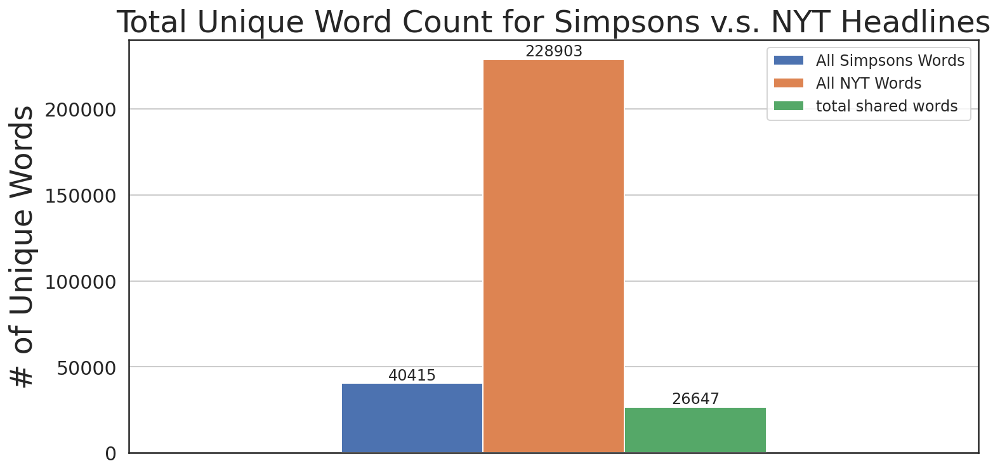

In [128]:
ax = wordcount.plot.bar(title="Total Unique Word Count for Simpsons v.s. NYT Headlines",rot=0, grid=True, figsize=(12,6))
for container in ax.containers:
    ax.bar_label(container)

x_axis = ax.axes.get_xaxis()
x_axis.set_visible(False)
ax.set_ylabel("# of Unique Words")
plt.yticks(fontsize = 15) 
ax = ax.legend(loc='upper left',bbox_to_anchor=(1.0, 1.0))
plt.legend(fontsize = 12)
plt.rcParams['font.size'] = 10

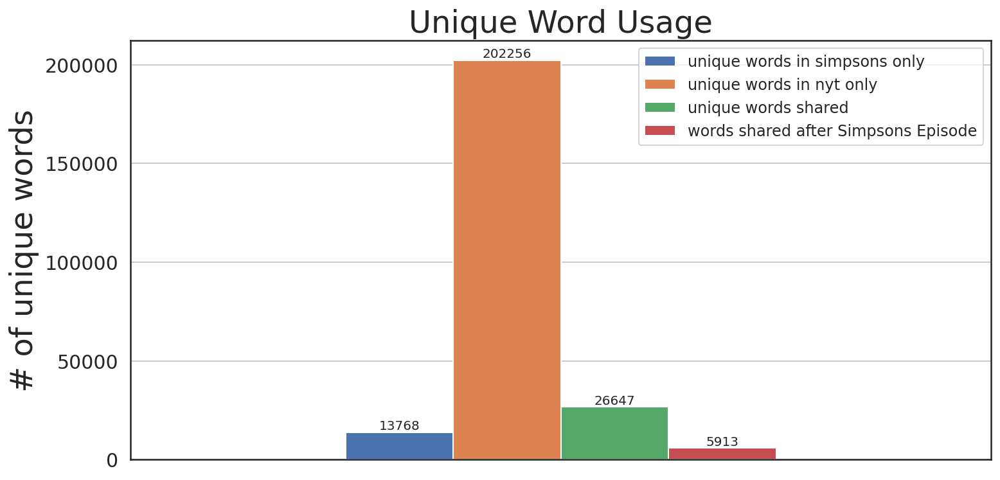

In [127]:
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
ax = shared_words.plot.bar(title="Unique Word Usage", grid=True, figsize=(12,6))
for container in ax.containers:
    ax.bar_label(container)

x_axis = ax.axes.get_xaxis()
x_axis.set_visible(False)
ax.set_ylabel("# of unique words")

ax = ax.legend(loc='upper left',bbox_to_anchor=(1.0, 1.0))
plt.yticks(fontsize = 15) 
plt.legend(fontsize = 12)
plt.rcParams['font.size'] = 12

As we can see, of the total number of words in our data set, only 11% of the total words are shared between them. That's much higher than expected. However, the use of unique words in the NYT after being used in the Simpsons is around 2.5%. That's higher than 1% but not by much.

In [118]:
df2 = df.T

indexlist = []
for x in range(len(df2)):
    indexlist.append(x)

df2['word stem'] = df2.index
df2['# of days'] = df2[0]
df2['# of years'] = df2['# of days']/365
df2['index'] = indexlist
df2 = df2.drop(0, axis=1)
df2.set_index('index')

,word stem,# of days,# of years
index,,,
0,marg,1017,2.786301
1,:,15,0.041096
2,ooh,315,0.863014
3,!,17,0.046575
4,care,16,0.043836
...,...,...,...
5908,brezza,425,1.164384
5909,sarando,522,1.430137
5910,binge-worthi,11,0.030137


### Time Difference Frequency Analysis

The histograms generated from our EDA directly address the subquestion: How closely do the episode's transcripts' air date and New York Times' article publication dates coincide? Most word matches are concentrated within the earlier years, suggesting a more immediate influence of "The Simpsons" content on the language used in NYT headlines. These insights add to our understanding of time based trends between the fictional narratives in "The Simpsons" and the real-world events reported by the New York Times, offering evidence to contextualize the broader research question regarding the alleged predictive nature of the show's content. However, it should be noted that the analysis here is focused on individual word stems and not broader societal topics.


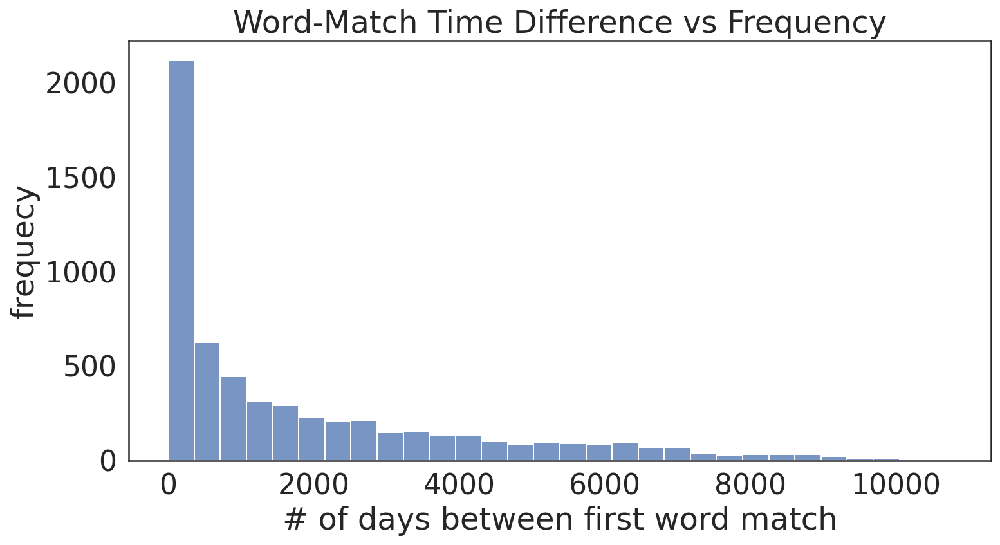

In [126]:
fig, ax = plt.subplots(figsize=(12, 6))
az = sns.histplot(data=df2, x="# of days",bins=30)
az.set(xlabel='# of days between first word match', ylabel='frequecy')
az.set(title='Word-Match Time Difference vs Frequency')
plt.show()

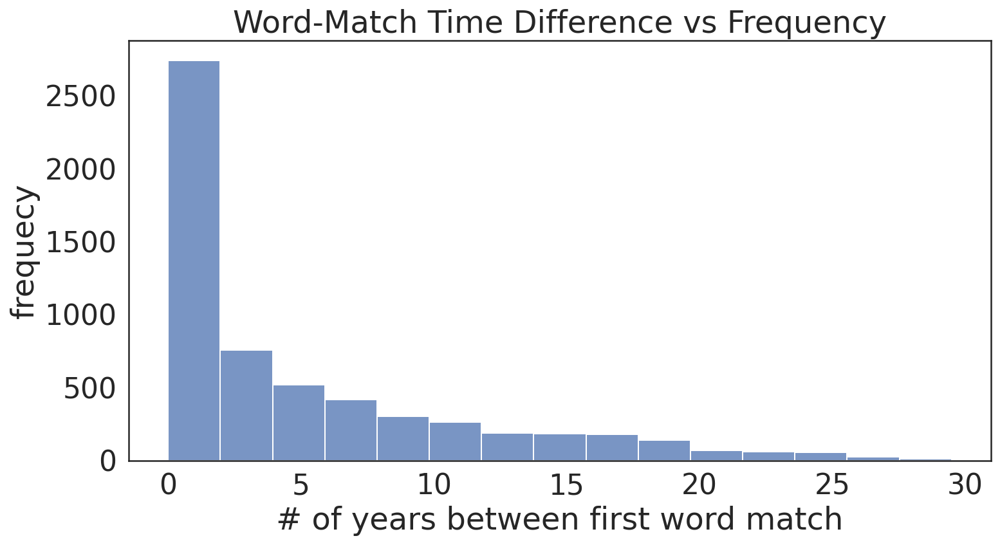

In [120]:
fig, ax = plt.subplots(figsize=(12, 6))
az = sns.histplot(data=df2, x="# of years",bins=15)
az.set(xlabel='# of years between first word match', ylabel='frequecy')
az.set(title='Word-Match Time Difference vs Frequency')
plt.show()

As we see here, if a word is actually used in *The Simpsons* and then later used in a NYT headline, most of the time it happens in the first 5 years.

## Word Embedding Analysis

We will now begin the process of embedding all the Simpsons data along with all of the New York Times data and pair any related New York Times article with a related Simpsons epsiode

In [1]:
import pandas as pd
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
import torch
from transformers import BertTokenizer, BertModel
import re
import json

In [29]:
 # Simpsons Data
df_s = pd.read_csv("simpsons_data.csv")
df_s.head()

,Unnamed: 0,no. overall,season,no. in season,title,director,writer,air date,prod. code,viewers,script
0,0,1.0,1.0,1.0,simpsons roasting on an open fire,david silverman,mimi pond,1989-12-17,7G08,26.7,"Marge: Ooh! Careful, Homer! Homer: There's no..."
1,1,2.0,1.0,2.0,bart the genius,david silverman,jon vitti,1990-01-14,7G02,24.5,"Bart: Come on, Mom. Lisa: Yeah, Mom. Hurry up..."
2,2,3.0,1.0,3.0,homers odyssey,wes archer,jay kogen & wallace wolodarsky,1990-01-21,7G03,27.5,"(chattering) Mrs. Krabappel: Now class, I don..."
3,3,4.0,1.0,4.0,theres no disgrace like home,gregg vanzo & kent butterworth,al jean & mike reiss,1990-01-28,7G04,20.2,"Bart: Yeah. Lisa: Yeah. Bart: Oh, yeah? Lis..."
4,4,5.0,1.0,5.0,bart the general,david silverman,john swartzwelder,1990-02-04,7G05,27.1,"Inside, HOMER opens an oven. HOMER: Do I smel..."


In [30]:
# New York Times Data
NYT_df = pd.read_csv("combined_NYT.csv")
NYT_df.head()

C:\Users\Kevin Yu\AppData\Local\Temp\ipykernel_8640\311933002.py:2: DtypeWarning: Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.
  NYT_df = pd.read_csv("combined_NYT.csv")


,headline,source,word_count,url,print_section,print_page,author,type,pub_date,news_desk,section,year
0,Bridge,The New York Times,411.0,https://www.nytimes.com/1990/01/01/nyregion/br...,1,45.0,By Alan Truscott,article,1990-01-01T05:00:00+0000,Metropolitan Desk,New York,1990.0
1,He Has Tyson On His Mind,The New York Times,199.0,https://www.nytimes.com/1990/01/01/sports/spor...,1,38.0,By Phil Berger,article,1990-01-01T05:00:00+0000,Sports Desk,Sports,1990.0
2,"For Dinkins, Pomp, Ceremony, Triumph And a Dre...",The New York Times,1233.0,https://www.nytimes.com/1990/01/01/nyregion/fo...,1,27.0,By Don Terry,article,1990-01-01T05:00:00+0000,Metropolitan Desk,New York,1990.0
3,Army Doesn't Have to Compete With Marines; W...,The New York Times,524.0,https://www.nytimes.com/1990/01/01/opinion/l-a...,1,24.0,NaN,article,1990-01-01T05:00:00+0000,Editorial Desk,Opinion,1990.0
4,Students Must Get to School and Back Safely,The New York Times,363.0,https://www.nytimes.com/1990/01/01/opinion/l-s...,1,24.0,NaN,article,1990-01-01T05:00:00+0000,Editorial Desk,Opinion,1990.0


In [31]:
# We will now preprocess and split all the simpsons transcripts into subparts so that we can apply a text summarization model onto the text and put it into the proper input length to embedd
df_s['script_s'] = df_s['script'].astype(str)
#Splits a given text into chunks of specified size.

def split_text(row, chunk_size):
    
    return [row[i:i + chunk_size] for i in range(0, len(row), chunk_size)]

df_s['script_chunks'] = df_s['script_s'].apply(lambda x: split_text(x, 2000))
scrps = np.array(df_s.get("script_chunks"))
scrps[0:5]

array([list(["Marge: Ooh! Careful, Homer!  Homer: There's no time to be careful. We're late.  (tires screeching)  Class: ♪ O little town of Bethlehem ♪  ♪ How still we see thee lie ♪  Marge (whispering): Sorry. Excuse me. Pardon me. Sorry. Excuse me.  Homer: Hey, Norman, how’s it goin’? So you got dragged down here too, huh? How you doin’, Fred?  Marge: Sorry. Excuse me.  Homer: Yeah. ‘Scuse me. Oh!  (yelps)  Homer: Pardon my galoshes. (laughs)  Class: ♪ Are met in thee tonight ♪  (applause)  Skinner: (laughs) Wasn't that wonderful? And now, ‘Santas of Many Lands,’ as presented by the entire second grade class.  Marge: Oh! Lisa's class.  Girl: Frohliche Weihnachten. That's German for ‘Merry Christmas.’ In Germany, Santa’s servant Ruprecht gives presents to good children, and whipping rods to the parents of bad ones.  (applause)  Boy: Merry Kurisumasu. I am Hotseiosha, a Japanese priest who acts like Santa Claus. I have eyes in the back of my head, so children better behave when I'm nea

In [ ]:
# We will then utilze batch processing to efficiently summarize the large amount of text while also tagging the text with an index to locate the episode later

def summarize_script(scripts, batch_size=5):
    tokenizer = BartTokenizer.from_pretrained('facebook/bart-large-cnn')
    model = BartForConditionalGeneration.from_pretrained('facebook/bart-large-cnn')

    summaries = []
    batch = []

    for episode_index, episode in enumerate(scripts, start=1):
        print("episode " + str(episode_index))
        for part_index, part in enumerate(episode, start=1):
            batch.append(part)
            if len(batch) == batch_size:
                inputs = tokenizer(batch, return_tensors='pt', padding=True, truncation=True, max_length=1024)
                summary_ids = model.generate(inputs['input_ids'], max_length=150, min_length=40, length_penalty=2.0, num_beams=4, early_stopping=True)
                for i, summary_id in enumerate(summary_ids):
                    summary = tokenizer.decode(summary_id, skip_special_tokens=True)
                    tag = f'Episode {episode_index}, Part {part_index - batch_size + i + 1}'
                    summaries.append((tag, summary))
                batch = []
            print(str(part_index) + " done")

    
    if batch:
        inputs = tokenizer(batch, return_tensors='pt', padding=True, truncation=True, max_length=1024)
        summary_ids = model.generate(inputs['input_ids'], max_length=150, min_length=40, length_penalty=2.0, num_beams=4, early_stopping=True)
        for i, summary_id in enumerate(summary_ids):
            summary = tokenizer.decode(summary_id, skip_special_tokens=True)
            tag = f'Episode {episode_index}, Part {part_index - len(batch) + i + 1}'
            summaries.append((tag, summary))

    return summaries

episode_summaries = summarize_script(scrps)

In [6]:
episode_summaries

[['Episode 1, Part 1',
  "Marge: Ooh! Careful, Homer! Homer: There's no time to be careful. We're late. (tires screeching)  Class: ♪ O little town of Bethlehem. Homer: Pardon my galoshes."],
 ['Episode 1, Part 2',
  "Homer: Marge, haven't you finished that stupid letter yet? Marge’s Voice: ‘Homer sends his love. Happy holidays’ ‘The Simpsons’ is on Channel 4 at 8pm on Christmas Day."],
 ['Episode 1, Part 3',
  'Homer is excited. Of all the men you could’ve married, I don’t know why you picked one who’s always so rude to us. Homer: (screams)  Bart: Good one, Dad. (applauds) Homer: Okay, kids, prepare to be dazzled. Marge, turn on the juice! (electricity crackling)'],
 ['Episode 1, Part 4',
  "Homer: Marge, I wanna do the Christmas shopping this year. Marge: I get the feeling there's something you haven't told me, Homer. Homer: (chuckles) How silly of me. This’ll be the best Christmas yet. The best any family ever had."],
 ['Episode 1, Part 5',
  "Homer gets a part-time job working as a 

In [7]:
# This loads in the model we will utilize for embeddings
model = BertModel.from_pretrained('bert-base-uncased',
                                  output_hidden_states = True,
                                  )
model.eval()

BertModel(
  (embeddings): BertEmbeddings(
    (word_embeddings): Embedding(30522, 768, padding_idx=0)
    (position_embeddings): Embedding(512, 768)
    (token_type_embeddings): Embedding(2, 768)
    (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
    (dropout): Dropout(p=0.1, inplace=False)
  )
  (encoder): BertEncoder(
    (layer): ModuleList(
      (0-11): 12 x BertLayer(
        (attention): BertAttention(
          (self): BertSelfAttention(
            (query): Linear(in_features=768, out_features=768, bias=True)
            (key): Linear(in_features=768, out_features=768, bias=True)
            (value): Linear(in_features=768, out_features=768, bias=True)
            (dropout): Dropout(p=0.1, inplace=False)
          )
          (output): BertSelfOutput(
            (dense): Linear(in_features=768, out_features=768, bias=True)
            (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
            (dropout): Dropout(p=0.1, inplace=False)
  

In [8]:
# We will now tokenize all our epsiode summaries and prepare it for embedding

tkn = BertTokenizer.from_pretrained('bert-base-uncased')

eps_tokenized = []

for ep in episode_summaries:
    marked_text = "[CLS] " + str(ep[1]) + " [SEP]"
    tokenized = tkn.tokenize(marked_text)
    eps_tokenized.append(tokenized)

eps_tokenized

[['[CLS]',
  'marge',
  ':',
  'o',
  '##oh',
  '!',
  'careful',
  ',',
  'homer',
  '!',
  'homer',
  ':',
  'there',
  "'",
  's',
  'no',
  'time',
  'to',
  'be',
  'careful',
  '.',
  'we',
  "'",
  're',
  'late',
  '.',
  '(',
  'tires',
  'sc',
  '##ree',
  '##ching',
  ')',
  'class',
  ':',
  '[UNK]',
  'o',
  'little',
  'town',
  'of',
  'bethlehem',
  '.',
  'homer',
  ':',
  'pardon',
  'my',
  'gal',
  '##osh',
  '##es',
  '.',
  '[SEP]'],
 ['[CLS]',
  'homer',
  ':',
  'marge',
  ',',
  'haven',
  "'",
  't',
  'you',
  'finished',
  'that',
  'stupid',
  'letter',
  'yet',
  '?',
  'marge',
  '’',
  's',
  'voice',
  ':',
  '‘',
  'homer',
  'sends',
  'his',
  'love',
  '.',
  'happy',
  'holidays',
  '’',
  '‘',
  'the',
  'simpsons',
  '’',
  'is',
  'on',
  'channel',
  '4',
  'at',
  '8',
  '##pm',
  'on',
  'christmas',
  'day',
  '.',
  '[SEP]'],
 ['[CLS]',
  'homer',
  'is',
  'excited',
  '.',
  'of',
  'all',
  'the',
  'men',
  'you',
  'could',
  '’',
  'v

In [9]:
eps_embeddings = []


start = 1
max_length = 512  
count = 0

for token_s in eps_tokenized:
    # Turns our tokens into their index in the corpus
    indexed_tokens = tkn.convert_tokens_to_ids(token_s)
    
    # Truncate the sequence if it's longer than the max length
    indexed_tokens = indexed_tokens[:max_length]
    segments_ids = [start] * len(indexed_tokens)
    
    tokens_tensor = torch.tensor([indexed_tokens])
    segments_tensors = torch.tensor([segments_ids])

    # Generates the embedding
    with torch.no_grad():
        outputs = model(tokens_tensor, segments_tensors)
        hidden_states = outputs[2]

    token_embeddings = torch.stack(hidden_states, dim=0)
    token_embeddings = torch.squeeze(token_embeddings, dim=1)
    
    # Adding the embedding to our list, more specifically, the embedding of the first and last token
    token_vecs = hidden_states[-2][0]
    eps_embeddings.append(token_vecs)
    count +=1
    if count % 1000 == 0:
        print(count)
    

        

eps_embeddings

1000
2000
3000
4000
5000


[tensor([[-0.1296, -0.6531,  0.1340,  ...,  0.0419, -0.0482,  0.2778],
         [ 1.3218, -0.4320,  0.2171,  ...,  0.0768,  0.9222, -0.1568],
         [-0.1794, -0.5472, -0.4646,  ...,  0.3163,  0.5961,  1.6277],
         ...,
         [ 0.2186, -0.3542,  0.2810,  ...,  0.3420,  0.0282,  0.3110],
         [-0.4247, -1.1131, -0.1423,  ...,  0.6614, -0.1624, -1.0427],
         [ 0.0222, -0.0405,  0.0406,  ...,  0.0675, -0.0135, -0.0166]]),
 tensor([[-0.3203, -0.4594,  0.9003,  ..., -0.3836,  0.1721,  0.3139],
         [ 0.6636,  0.2828,  0.0133,  ..., -0.1807,  1.2136, -0.6443],
         [-0.0295,  0.0524,  0.0232,  ...,  0.4317,  0.6197,  1.2160],
         ...,
         [-1.1996,  0.7711,  2.3214,  ...,  0.0736,  1.1035, -0.1797],
         [ 0.0321,  0.0134, -0.0151,  ...,  0.0217, -0.0068, -0.0206],
         [ 0.0111, -0.0161,  0.0478,  ...,  0.0222,  0.0307, -0.0117]]),
 tensor([[-0.2831, -0.3483,  0.0137,  ...,  0.1013,  0.0486,  0.4012],
         [ 0.3088,  0.4342,  0.2992,  ..., -0

In [10]:
embedded_eps = []
for vec in eps_embeddings:
    sentence_embedding = torch.mean(vec, dim= 0)
    embedded_eps.append(sentence_embedding)


#token_vecs = hidden_states[-2][0]
#sentence_embedding = torch.mean(token_vecs, dim=0)

embedded_eps

[tensor([-7.8192e-02,  5.7138e-03,  4.9785e-01,  2.8884e-02,  2.0898e-01,
          2.5931e-01,  8.7536e-02,  5.5205e-01,  1.1759e-01, -1.5031e-01,
         -5.3732e-02, -3.1784e-01,  2.6334e-02, -7.2938e-02, -5.1761e-01,
          3.2764e-01, -2.4827e-02,  1.5735e-01, -5.0980e-01,  1.3280e-01,
          4.0428e-01,  9.3488e-02, -2.1502e-01,  2.0660e-01,  4.3417e-01,
          1.6726e-01, -4.0413e-01,  1.7575e-01, -4.1101e-01, -2.4748e-01,
          4.8457e-01,  1.8273e-01, -1.2428e-01,  5.8855e-02,  2.2610e-01,
         -9.2063e-02, -7.1586e-03, -1.1872e-01,  1.6700e-01,  3.6797e-01,
         -2.3914e-01, -5.3446e-01,  1.5152e-01, -5.4025e-01,  2.5746e-01,
         -6.3713e-02,  3.0481e-01, -4.1005e-01,  4.7871e-01, -3.7425e-01,
         -2.1677e-01,  3.3948e-01, -1.2508e-01, -1.4310e-01, -1.8795e-01,
          2.5218e-01, -3.9144e-01, -5.2070e-01,  8.1851e-02, -4.2471e-01,
         -3.3789e-01,  1.3108e-01, -1.0650e-01,  8.2123e-02, -2.7967e-01,
         -7.3912e-02,  5.8355e-02,  3.

Now we need to generate the embeddings for the New York Times data

In [11]:
NYT_h = np.array(NYT_df.get("headline"))
NYT_h

array(['Bridge', '  He Has Tyson On His Mind',
       'For Dinkins, Pomp, Ceremony, Triumph And a Dream Realized', ...,
       'U.S. Review of Options-Exchange Deals',
       'Paid Notice: Deaths  BAER, MORRIS (MOE)',
       'Cobble Hill Denounces Plan for a Homeless Shelter'], dtype=object)

In [13]:
# Repeating the tokenization process we did earlier
tkn = BertTokenizer.from_pretrained('bert-base-uncased')

titles_tokenized = []

for title in NYT_h:
    marked_text = "[CLS] " + str(title) + " [SEP]"
    tokenized = tkn.tokenize(marked_text)
    titles_tokenized.append(tokenized)

titles_tokenized

[['[CLS]', 'bridge', '[SEP]'],
 ['[CLS]', 'he', 'has', 'tyson', 'on', 'his', 'mind', '[SEP]'],
 ['[CLS]',
  'for',
  'din',
  '##kins',
  ',',
  'po',
  '##mp',
  ',',
  'ceremony',
  ',',
  'triumph',
  'and',
  'a',
  'dream',
  'realized',
  '[SEP]'],
 ['[CLS]',
  'army',
  'doesn',
  "'",
  't',
  'have',
  'to',
  'compete',
  'with',
  'marines',
  ';',
  'why',
  'we',
  'need',
  'a',
  'navy',
  '[SEP]'],
 ['[CLS]',
  'students',
  'must',
  'get',
  'to',
  'school',
  'and',
  'back',
  'safely',
  '[SEP]'],
 ['[CLS]', 'calm', 'sought', 'in', 'argentina', '[SEP]'],
 ['[CLS]', 'israeli', 'or', 'driver', '?', 'how', 'signals', 'cross', '[SEP]'],
 ['[CLS]', 'how', 'to', 're', '##wire', 'america', '[SEP]'],
 ['[CLS]',
  'exchange',
  'chairman',
  'aims',
  'to',
  'polish',
  'image',
  'of',
  'futures',
  'industry',
  ':',
  'leo',
  'mel',
  '##ame',
  '##d',
  ',',
  'chicago',
  'mer',
  '##c',
  '[SEP]'],
 ['[CLS]', 'cnn', 'lawsuit', 'on', 'vietnam', '[SEP]'],
 ['[CLS]',

In [ ]:
NYT_embeddings = []

# This variable is used to keep track of what sentence we are on
start = 1
max_length = 512  # Max length for BERT
count = 0

for token_s in titles_tokenized:
    # Turns our tokens into their index in the corpus
    indexed_tokens = tkn.convert_tokens_to_ids(token_s)
    
    # Truncate the sequence if it's longer than the max length
    indexed_tokens = indexed_tokens[:max_length]
    segments_ids = [start] * len(indexed_tokens)
    
    tokens_tensor = torch.tensor([indexed_tokens])
    segments_tensors = torch.tensor([segments_ids])

    # Generates the embedding
    with torch.no_grad():
        outputs = model(tokens_tensor, segments_tensors)
        hidden_states = outputs[2]

    token_embeddings = torch.stack(hidden_states, dim=0)
    token_embeddings = torch.squeeze(token_embeddings, dim=1)
    
    # Adding the embedding to our list, more specifically, the embedding of the first and last token
    token_vecs = hidden_states[-2][0]
    NYT_embeddings.append(token_vecs)
    count +=1
    if count % 1000 == 0:
        print(count)
        print(len(NYT_embeddings))

        
# took 3+ hours to complete, done on a virtual machine
NYT_embeddings

In [ ]:
embedded_NYT = []
count = 0
for vec in NYT_embeddings:
    count += 1
    sentence_embedding = torch.mean(vec, dim= 0)
    embedded_NYT.append(sentence_embedding)
    if count % 10000 == 0:
        print(count)


#token_vecs = hidden_states[-2][0]
#sentence_embedding = torch.mean(token_vecs, dim=0)

embedded_NYT

In [12]:
embedded_NYT #loaded in file

array([[ 0.02947077, -0.11080568, -0.38632014, ..., -0.29749233,
        -0.36077103,  0.13676375],
       [ 0.09954416, -0.26676574, -0.12646666, ..., -0.11833544,
         0.11705686,  0.09663083],
       [ 0.1685247 , -0.15726343,  0.26934204, ..., -0.2472681 ,
         0.18903746,  0.12008119],
       ...,
       [-0.5621125 , -0.47461876, -0.5879215 , ..., -0.1806361 ,
         0.02755017,  0.09996086],
       [ 0.18217446, -0.26890913,  0.5846259 , ..., -0.2809389 ,
         0.32157356, -0.11204043],
       [-0.8224073 ,  0.10001626, -0.3075354 , ..., -0.17085592,
        -0.23487526,  0.27729306]], dtype=float32)

In [14]:
embeddings = embedded_NYT

In [15]:
# Converting to numpy array to prepare embeddings for cosine similarity comparisons
embeddings_s = embedded_eps.numpy()
embeddings_s 

array([[-0.0781918 ,  0.00571378,  0.49784535, ...,  0.1081502 ,
         0.06374231, -0.01996557],
       [-0.10442753, -0.05958769,  0.81747335, ...,  0.01521136,
         0.4009224 ,  0.2478862 ],
       [ 0.05391486,  0.07971397,  0.27528754, ...,  0.04153854,
         0.37359497, -0.01030005],
       ...,
       [ 0.11814638,  0.06976289,  0.28985587, ..., -0.11365507,
         0.36503807,  0.13511644],
       [ 0.33639574,  0.33835253,  0.42438173, ..., -0.12743688,
         0.46558577,  0.293113  ],
       [ 0.23819762,  0.01098745,  0.13624306, ...,  0.08111217,
         0.10233913, -0.08873652]], dtype=float32)

In [16]:
sum_impor = []
for x in episode_summaries:
    sum_impor.append(x[1])

sum_impor

["Marge: Ooh! Careful, Homer! Homer: There's no time to be careful. We're late. (tires screeching)  Class: ♪ O little town of Bethlehem. Homer: Pardon my galoshes.",
 "Homer: Marge, haven't you finished that stupid letter yet? Marge’s Voice: ‘Homer sends his love. Happy holidays’ ‘The Simpsons’ is on Channel 4 at 8pm on Christmas Day.",
 'Homer is excited. Of all the men you could’ve married, I don’t know why you picked one who’s always so rude to us. Homer: (screams)  Bart: Good one, Dad. (applauds) Homer: Okay, kids, prepare to be dazzled. Marge, turn on the juice! (electricity crackling)',
 "Homer: Marge, I wanna do the Christmas shopping this year. Marge: I get the feeling there's something you haven't told me, Homer. Homer: (chuckles) How silly of me. This’ll be the best Christmas yet. The best any family ever had.",
 "Homer gets a part-time job working as a Santa down at the mall. Todd: Hey, Mr. Simpson, you dropped your pork chop. Moe: What's the matter, Homer? Somebody leave a 

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity # we are going to use this to compare our embeddings


embeddings = np.array(embeddings)
embeddings_s = np.array(embeddings_s)

# Process in batches
batch_size = 32  
matching_titles = {joke: [] for joke in sum_impor}
similarity_threshold = 0.87
for i in range(0, len(embeddings), batch_size):
    
    if i % 32000 == 0:
        print(i)
    batch_embeddings = embeddings[i:i + batch_size]

    # Calculate cosine similarity
    similarities = cosine_similarity(batch_embeddings, embeddings_s)

    for j, nyt_embedding in enumerate(batch_embeddings):
        for simpsons_index, similarity in enumerate(similarities[j]):
            if similarity > similarity_threshold:
               matching_titles[sum_impor[simpsons_index]].append(NYT_h[i + j])

Here we can see that after matching each article with the embedding of a simpsons episode segnment (if the two vectors passed a certian similarity score), the Simpsons jokes only appear to contain the broad overarching topics contained in the articles and almost none of the articles actually match with the specifics of what the Simpsons joke/segment is describing

In [18]:
# This will take the dictionary generated and create a new dictionary of only the jokes that had matching headlines
non_empty_matching_titles_2 = {key: value for key, value in matching_titles.items() if value}
non_empty_matching_titles_2

{'Homer: How could anyone make a word out of these lousy letters? Lisa: “Id” Triple word score. Bart: "Kwyjibo." Uh- A big, dumb, balding, North American ape with no chin.': ["So You Want a Black Director for Your Movie?;   Japanese 'Medea'",
  'After Drug Raid, a Harlem Hill Finds Hope LP>The family-run Franchise Restaurant, a little place in Harlem with four tables and a stubby red and green metal canopy, featured curried goat, beef patties and other West Indian dishes. But the daily special, the police and neighbors say, was marijuana -- and sometimes murder.   "Food was secondary," said a musician who lives around the corner. "People would go in and come out in 30 seconds," he said. "There\'s fast food, but not that fast."'],
 'Homer: "What are you looking at, Bart? Are those naughty dogs back again?" Marge: "He\'s a good boy now, and he\'s getting better, and sometimes even the best sheep stray from the flock and need to be hugged extra hard" Principal Skinner: "I caught your son 

In [19]:
ep_parts = []
for x in non_empty_matching_titles_2:
    ep_parts.append(x)

#extracts only the keys so we can get a sense of which episodes sections were included
ep_parts

['Homer: How could anyone make a word out of these lousy letters? Lisa: “Id” Triple word score. Bart: "Kwyjibo." Uh- A big, dumb, balding, North American ape with no chin.',
 'Homer: "What are you looking at, Bart? Are those naughty dogs back again?" Marge: "He\'s a good boy now, and he\'s getting better, and sometimes even the best sheep stray from the flock and need to be hugged extra hard" Principal Skinner: "I caught your son defacing school property this morning. We estimate the damage at $75"',
 'Narrator: When most people think of nuclear energy, they think of this. Smithers: And so, this plant harnesses the power of the atom so that we have the energy to run everything from your favorite video game to yummy cotton candy machines. Joe Fission: The rods make the water so hot it boils.',
 'Homer: I defy anyone to tell the difference between these doughnuts and ones baked today. Lisa: Here’s a good job at the fireworks factory. Homer: Those perfectionists? Forget it. Moe: Is Mr. Fr

In [22]:
#storing only the episodes
eps = []
for x in episode_summaries:
    if x[1] in ep_parts:
        eps.append(x[0].split(",")[0])

eps

['Episode 2',
 'Episode 2',
 'Episode 3',
 'Episode 3',
 'Episode 5',
 'Episode 7',
 'Episode 11',
 'Episode 11',
 'Episode 14',
 'Episode 15',
 'Episode 15',
 'Episode 16',
 'Episode 17',
 'Episode 17',
 'Episode 18',
 'Episode 18',
 'Episode 19',
 'Episode 19',
 'Episode 21',
 'Episode 21',
 'Episode 22',
 'Episode 22',
 'Episode 22',
 'Episode 23',
 'Episode 24',
 'Episode 25',
 'Episode 25',
 'Episode 26',
 'Episode 26',
 'Episode 26',
 'Episode 26',
 'Episode 27',
 'Episode 28',
 'Episode 28',
 'Episode 28',
 'Episode 28',
 'Episode 29',
 'Episode 31',
 'Episode 31',
 'Episode 31',
 'Episode 31',
 'Episode 31',
 'Episode 32',
 'Episode 32',
 'Episode 32',
 'Episode 32',
 'Episode 33',
 'Episode 33',
 'Episode 33',
 'Episode 34',
 'Episode 34',
 'Episode 35',
 'Episode 35',
 'Episode 36',
 'Episode 36',
 'Episode 36',
 'Episode 36',
 'Episode 37',
 'Episode 37',
 'Episode 37',
 'Episode 37',
 'Episode 37',
 'Episode 37',
 'Episode 38',
 'Episode 38',
 'Episode 38',
 'Episode 38',
 

In [24]:
# extracting date of each episode in our dictionary
episode_to_air_date = pd.Series(df_s['air date'].values, index=df_s['no. overall']).to_dict()
updated_episode_list = [episode_to_air_date.get(float(episode.split(' ')[1]), 'Date Not Found') for episode in eps]
updated_episode_list

['1990-01-14',
 '1990-01-14',
 '1990-01-21',
 '1990-01-21',
 '1990-02-04',
 '1990-02-18',
 '1990-04-15',
 '1990-04-15',
 '1990-10-11',
 '1990-10-18',
 '1990-10-18',
 '1990-10-25',
 '1990-11-01',
 '1990-11-01',
 '1990-11-08',
 '1990-11-08',
 '1990-11-15',
 '1990-11-15',
 '1990-12-06',
 '1990-12-06',
 '1990-12-20',
 '1990-12-20',
 '1990-12-20',
 '1991-01-10',
 '1991-01-24',
 '1991-01-31',
 '1991-01-31',
 '1991-02-07',
 '1991-02-07',
 '1991-02-07',
 '1991-02-07',
 '1991-02-14',
 '1991-02-21',
 '1991-02-21',
 '1991-02-21',
 '1991-02-21',
 '1991-03-07',
 '1991-04-11',
 '1991-04-11',
 '1991-04-11',
 '1991-04-11',
 '1991-04-11',
 '1991-04-25',
 '1991-04-25',
 '1991-04-25',
 '1991-04-25',
 '1991-05-02',
 '1991-05-02',
 '1991-05-02',
 '1991-05-09',
 '1991-05-09',
 '1991-07-11',
 '1991-07-11',
 '1991-09-19',
 '1991-09-19',
 '1991-09-19',
 '1991-09-19',
 '1991-09-26',
 '1991-09-26',
 '1991-09-26',
 '1991-09-26',
 '1991-09-26',
 '1991-09-26',
 '1991-10-03',
 '1991-10-03',
 '1991-10-03',
 '1991-10-

In [ ]:
# This converts all the New York Times headlines into its respective publishing date

df_NYT['headline'] = df_NYT['headline'].astype(str)

updated_matching_titles = {}

for simpsons_joke, article_titles in non_empty_matching_titles_2.items():
    
    publication_dates = []

    for title in article_titles:
        
        matching_row = df_NYT[df_NYT['headline'] == title]
        pub_date = matching_row['pub_date'].iloc[0] if not matching_row.empty else 'Date Not Found'

        
        publication_dates.append(pub_date)

    
    updated_matching_titles[simpsons_joke] = publication_dates

In [ ]:
# This updates our dictionary so the key values are the episode air date, and the values are the headline publishing dates
updated_dict = {}
if len(updated_matching_titles) == len(updated_episode_list):
    for (key, value), new_key in zip(updated_matching_titles.items(), updated_episode_list):
        updated_dict[new_key] = value
else:
    print("Error")

In [25]:
updated_dict

{'1990-01-14': ['1990-12-24T05:00:00+0000'],
 '1990-01-21': ['1990-05-23T05:00:00+0000',
  '1990-12-16T05:00:00+0000',
  '1990-12-24T05:00:00+0000',
  '1991-04-13T05:00:00+0000',
  '1991-07-28T05:00:00+0000'],
 '1990-02-04': ['1990-12-24T05:00:00+0000'],
 '1990-02-18': ['1990-12-24T05:00:00+0000'],
 '1990-04-15': ['1990-06-03T05:00:00+0000', '1990-08-26T05:00:00+0000'],
 '1990-10-11': ['1990-12-24T05:00:00+0000'],
 '1990-10-18': ['1991-08-22T05:00:00+0000', '1991-10-15T05:00:00+0000'],
 '1990-10-25': ['1990-10-21T05:00:00+0000',
  '1990-12-24T05:00:00+0000',
  '1991-02-11T05:00:00+0000',
  '1991-07-28T05:00:00+0000',
  '1991-10-12T05:00:00+0000'],
 '1990-11-01': ['1990-12-24T05:00:00+0000'],
 '1990-11-08': ['1990-12-24T05:00:00+0000'],
 '1990-11-15': ['1990-12-24T05:00:00+0000'],
 '1990-12-06': ['1991-10-23T05:00:00+0000'],
 '1990-12-20': ['1990-08-26T05:00:00+0000',
  '1990-09-17T05:00:00+0000',
  '1990-12-24T05:00:00+0000',
  '1991-06-04T05:00:00+0000',
  '1991-10-12T05:00:00+0000'],

We now can view the proportion of article publishing dates that occured after each episodes air date:

In [26]:
from datetime import datetime

my_dict = updated_dict


def convert_to_datetime(date_str):
    try:
        return datetime.strptime(date_str.split('T')[0], '%Y-%m-%d')
    except ValueError:
        return None


ratios = {}

for key, date_list in my_dict.items():
    key_date = convert_to_datetime(key)
    if key_date:
        count_after = sum(convert_to_datetime(date) > key_date for date in date_list if convert_to_datetime(date))
        ratio = count_after / len(date_list) if date_list else 0
        ratios[key] = ratio
    else:
        ratios[key] = 'Key Date Invalid'

ratios

{'1990-01-14': 1.0,
 '1990-01-21': 1.0,
 '1990-02-04': 1.0,
 '1990-02-18': 1.0,
 '1990-04-15': 1.0,
 '1990-10-11': 1.0,
 '1990-10-18': 1.0,
 '1990-10-25': 0.8,
 '1990-11-01': 1.0,
 '1990-11-08': 1.0,
 '1990-11-15': 1.0,
 '1990-12-06': 1.0,
 '1990-12-20': 0.6,
 '1991-01-10': 0.0,
 '1991-01-24': 0.0,
 '1991-01-31': 0.0,
 '1991-02-07': 0.0,
 '1991-02-14': 0.0,
 '1991-02-21': 0.5454545454545454,
 '1991-03-07': 0.5,
 '1991-04-11': 0.2,
 '1991-04-25': 0.0,
 '1991-05-02': 0.0,
 '1991-05-09': 0.0,
 '1991-07-11': 0.0,
 '1991-09-19': 0.0,
 '1991-09-26': 0.5,
 '1991-10-03': 0.0,
 '1991-10-10': 0.0,
 '1991-10-17': 0.0,
 '1991-10-24': 1.0,
 '1991-10-31': 0.0,
 '1991-11-07': 0.0,
 '1991-11-14': 0.0,
 '1991-11-21': 0.0,
 '1991-12-05': 0.0,
 '1991-12-26': 0.0,
 '1992-01-09': 0.0,
 '1992-01-23': 0.0,
 '1992-02-06': 0.0,
 '1992-02-13': 0.0,
 '1992-02-20': 0.0,
 '1992-02-27': 0.0,
 '1992-03-12': 0.0,
 '1992-03-26': 0.0,
 '1992-04-09': 0.0,
 '1992-04-23': 0.0,
 '1992-05-07': 0.0,
 '1992-08-27': 0.0,
 '199

In [27]:
#percentage of Simpsons episode that have a "sucessful prediction"
ratios.pop('Date Not Found', None)
average_ratio = sum(float(value) for value in ratios.values()) / len(ratios)

average_ratio

0.023087583148558757

In [28]:
#percentage of Simpsons subparts that had a New York Times article matched to its cluster
len(non_empty_matching_titles_2)/len(episode_summaries)

0.2893479003072721

# Analysis Conclusion

With this, we are able to see that only 2.3% of the already broadly related topics occured when the simpsons made the joke before the event. Thus showing that even under the assumption that the events contained in the clusters were specific enough to count as a Simpsons prediction (almost all of which are not), only 2% of the events take place after the Simpsons episode mentions the topic. 

Through analysis and using the Simpsons' episode embeddings as labels for our clusters, we found that %28.9 of simpsons episodes have a correlation to a real world event. While this may suggest that the null hypothesis is true (simpsons can predict the future), taking a closer look in each of the clusters, we find that the article headline embeddings merely match the overall topic of the simpsons episode summary and do not share much similiarity in the speificis. This suggests through analysis on all simpsons scripts, even if relavent real world topics are mentioned, rarely any joke becomes speicfic enough to warrant a classifcation as a sucessful "prediction" and thus providing evidence that goes against the popular myth of simpsons being able to predict the future

# Ethics & Privacy

For our project we collected data from a diverse range of  dataset from newspapers, various databases, and scripts from all episodes of The Simpsons. Recognizing the importance of ethical considerations, we commit to obtaining informed consent for data sourced from newspapers and adhering to applicable licensing agreements for all datasets. Additionally, we approach the use of The Simpsons scripts with a commitment to fair use principles and compliance with copyright laws. In terms of copyright and licensing, we would not be breaking any copyright rules since we are not using the scripts from the episodes nor the newspaper articles for profit or producing material from them. All information used will be credited to the appropriate authors this will avoid any misinterpretation that we created the data. Lastly, there is some bias in our data since we are only using the scripts from The Simpsons when some predictions the show could have made about current events could appear as images so that would lower the amount of correlating events between the series and reality. 

# Discusison and Conclusion

Connecting back to the research question “What percentage of the Simpsons’ episodes’ transcripts reference real-world events before they appear as part of a New York Times headline?” We found out that the percentage is actually low and the instances that predicted actual real life events, like the Trump presidency or Lady Gaga headlining the Super Bowl, are merely rare coincidences that can be considered outliers in our data.

To find out our statistics for how successful the episodes were in predicting real world events, we utilized the dictionary generated after our cosine similarity comparison. The way the dictionary was structured was "Joke: New York Times article, New York Times article, New York Times article". With each joke containing a list of articles that matched with it. We then go into our original dataframe for each of the two datasets to get the date of the episodes air date and the articles publishing date and compare the two. After doing this for all values in the dictionary, we have our statistics of all events mentioned in simpsons episodes, what % actually were true predictions. After performing this analysis we were able to find out that a single joke from The Simpsons matches with dozens of New York Times. This does not necessarily mean that the joke predicted the real life event described in those New York Times’ articles. This led us to the conclusion that the joke generalized a lot about a certain event and those generalizations were the ones that matched The Simpsons’ script. 

Although these findings were not what we were looking for necessarily, it did give us an answer to our research question. Aside from the rare, yet surprising, coincidences the show “The Simpsons” do not seem to reference a big percentage of real-world events before they appear on The New York Times. There are some limitations to our research that could be addressed in possible  future renditions of this specific project. For example, we could include image analysis for scenes or jokes that might not be in the scripts and find out if the percentage of predictions increases in this way. We could also expand our news articles database by looking at other news networks aside from The New York Times. That way we could maybe get different information from a real-life event that might coincide with a Simpsons’ script. It is also important to consider that in the more recent episodes there might be correlations between what happens in them and future events that have not occurred yet.

All in all, we were able to find that The Simpsons show does not really predict real life events. Aside from the coincidences mentioned before we did not really find any other relevant matches that would add to the percentage of real life events that “The Simpsons” predicted. These findings are important beyond our research since it can teach us that sometimes in entertainment there can be coincidences like this but they do not necessarily mean that there’s a dark side to them that is trying to warn us about the future, it is more with the purpose of making the public laugh and intrigued,



# Team Contributions

- Uma: Writing portions (Abstract), Team organization/timeline, EDA, Video/Slides 
- Kevin: Some writing, Organization, Data wrangling, Research, Data Analysis, Results interpretation 
- Nicholas: Simpsons Transcript/Episode Dataset creation, EDA Refinement, Research Question & Background
- Hongyuan: EDA, Data Analysis, CSV File Processing 
- Jelani: Conclusion/discussion portion, Ethics/Data privacy 
